In [1]:
!pip uninstall -y ip-adapter diffusers
!pip install --no-cache-dir git+https://github.com/Ahmed-Sherif-ASA/IP-Adapter@main
# !pip install --upgrade diffusers
!pip install diffusers

# Cell 2: Import after fresh install
import ip_adapter
from ip_adapter import IPAdapterXL
from diffusers import ControlNetModel, StableDiffusionXLControlNetPipeline


Found existing installation: ip-adapter 0.1.0
Uninstalling ip-adapter-0.1.0:
  Successfully uninstalled ip-adapter-0.1.0
Found existing installation: diffusers 0.35.1
Uninstalling diffusers-0.35.1:
  Successfully uninstalled diffusers-0.35.1
  Cloning https://github.com/Ahmed-Sherif-ASA/IP-Adapter (to revision main) to /tmp/pip-req-build-1vgkflb_
  Running command git clone --filter=blob:none --quiet https://github.com/Ahmed-Sherif-ASA/IP-Adapter /tmp/pip-req-build-1vgkflb_
  Resolved https://github.com/Ahmed-Sherif-ASA/IP-Adapter to commit 90c1199c689fff358c3d1c4f55e25900a6d7cafc
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for ip-adapter: filename=ip_adapter-0.1.0-py3-none-any.whl size=33616 sha256=075632bdd783397d41f75fe4ad2ba638dacc56780fb9ccd6abcf39d858751023
  Stored in directory: /tmp/pip-ephem-wheel-cache-j26qb9qm/wheels/7b/d8/4d/534ce7f0037f9a8e2bd1871738bbd6210640c7b46779

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from PIL import Image

import config  # ✅ will work if notebook is in same folder as config.py
from data.dataset import UnifiedImageDataset

In [3]:
colour_df = pd.read_csv("/data/thesis/laion_5m_manifest.csv")
colour_dataset = UnifiedImageDataset(
    colour_df.rename(columns={"local_path":"file_path"}),
    mode="file_df",
    size=(224,224),     # <- must match generation
    subset_ratio=1.0
)
colour_df.head()

,id,url,caption,aesthetic,local_path
0,6744,https://t0.gstatic.com/images?q=tbn:ANd9GcQM-D...,Wrought Iron King Headboard And Footboard by B...,7.297200,/data/thesis/laion_5m_images/0006744.jpg
1,5801,https://i.dailymail.co.uk/1s/2020/03/24/16/263...,Kayley and Ryan said they were determined to '...,7.451863,/data/thesis/laion_5m_images/0005801.jpg
2,8959,https://cdn.shopify.com/s/files/1/2068/6307/pr...,Pink Minnie Mouse suspender dress,7.530277,/data/thesis/laion_5m_images/0008959.jpg
3,9283,http://t0.gstatic.com/images?q=tbn:ANd9GcSxmV1...,Xmas Home Decorating Ideas by Best 25 Christma...,7.742550,/data/thesis/laion_5m_images/0009283.jpg
4,2750,https://cdn.smokymountains.com/vacation-rental...,Photo of a Gatlinburg Cabin named The Blue Spr...,7.035913,/data/thesis/laion_5m_images/0002750.jpg


In [4]:
layout_df = pd.read_csv("/data/thesis/adimagenet_manifest.csv")
layout_dataset = UnifiedImageDataset(layout_df, mode="file_df", size=(224,224))
layout_df.head()

,file_path,file_name,text,dimensions,width,height
0,"/data/thesis/AdImageNet/images/(300, 250)/ad_0...",ad_000001.jpg,$3\nSTULZ\nDifferential for 2nd Shift\nManufac...,"(300, 250)",300,250
1,"/data/thesis/AdImageNet/images/(300, 250)/ad_0...",ad_000009.jpg,VULTURE\ninto\nwith\nSam Sanders\nApple Podcasts,"(300, 250)",300,250
2,"/data/thesis/AdImageNet/images/(300, 250)/ad_0...",ad_000017.jpg,smart\ncare\nO\ndesign\nbuild\n& install\nrepa...,"(300, 250)",300,250
3,"/data/thesis/AdImageNet/images/(300, 600)/ad_0...",ad_000020.jpg,"TREE\nSANTOR\nMatch On!\nThe Showstopper,\nLuc...","(300, 600)",300,600
4,"/data/thesis/AdImageNet/images/(300, 250)/ad_0...",ad_000021.jpg,Local experts connecting\ncustomers to YOUR bu...,"(300, 250)",300,250


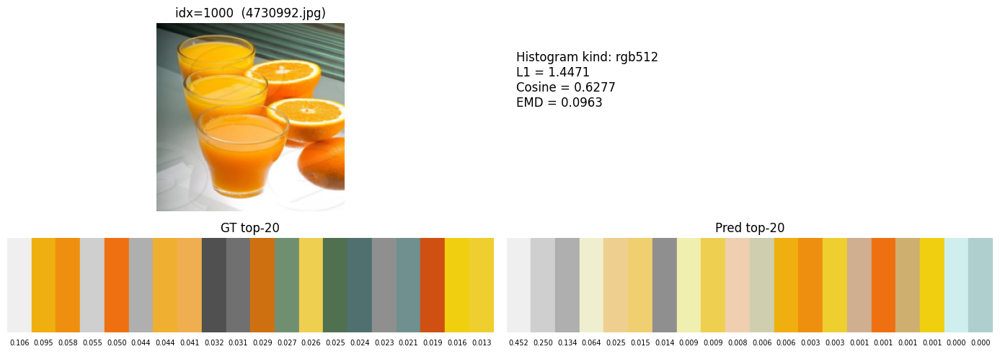

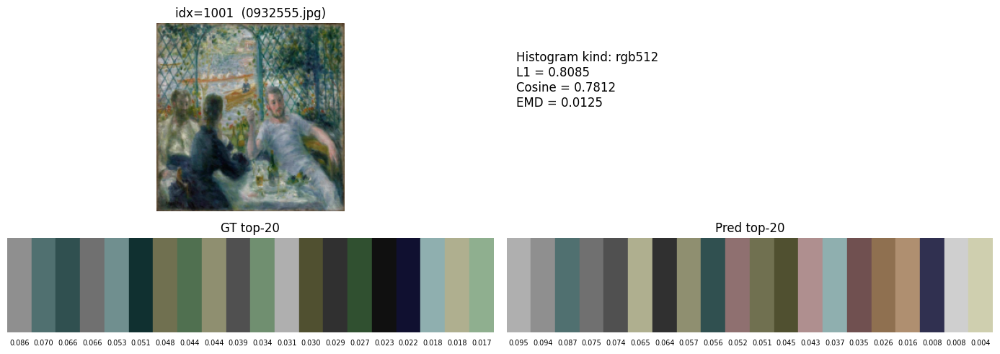

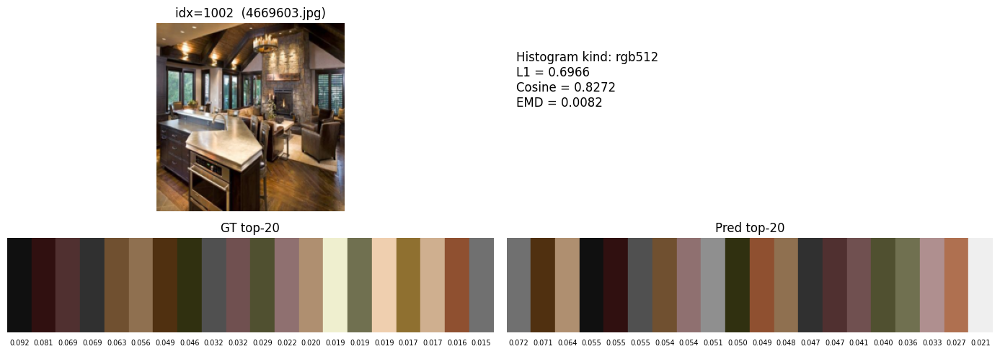

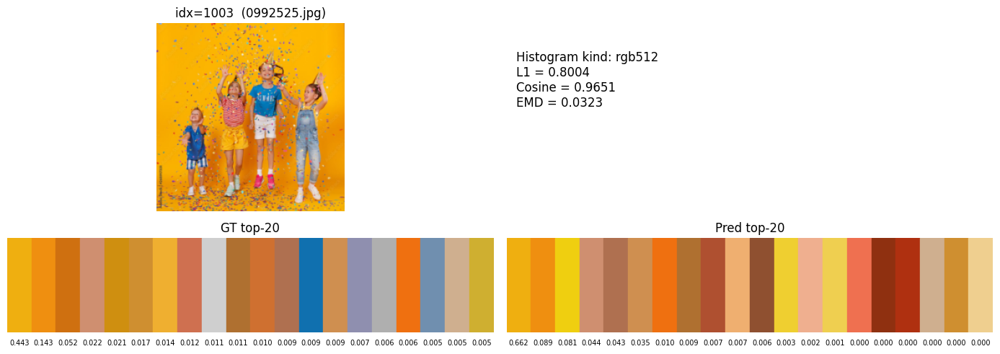

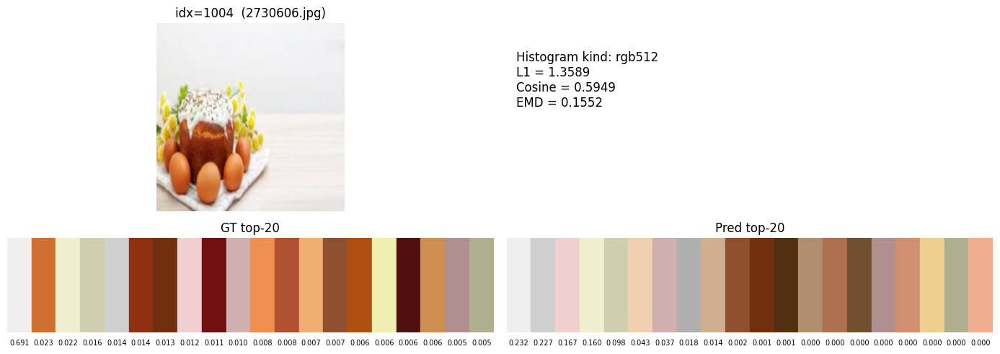

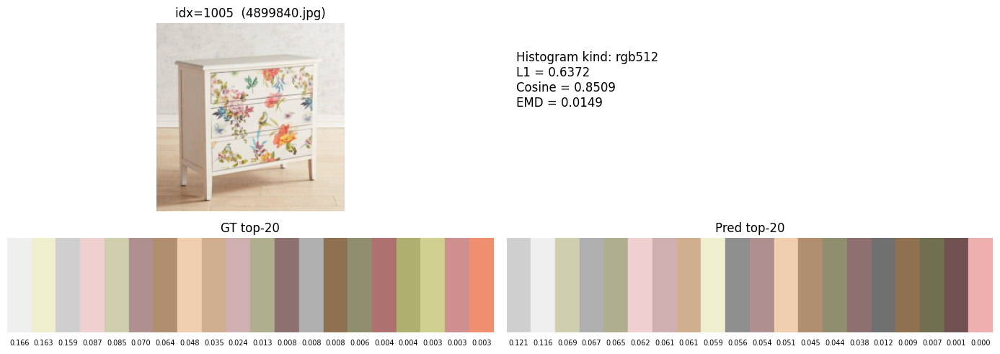

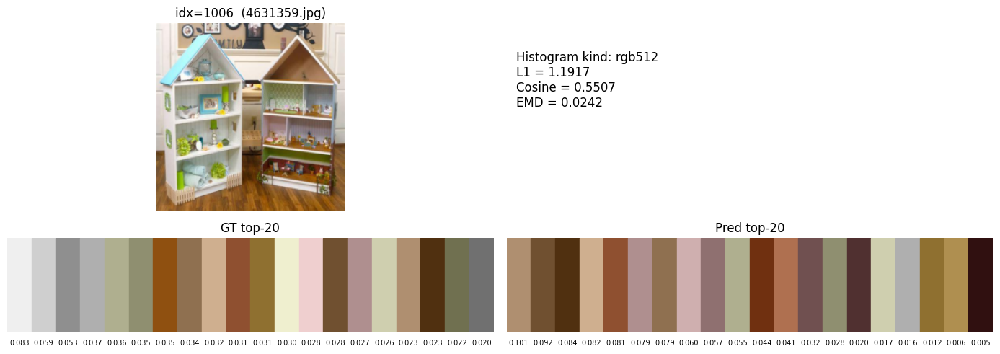

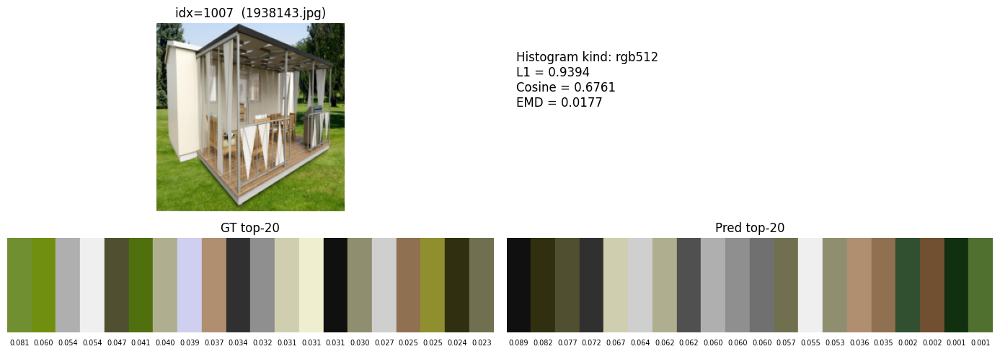

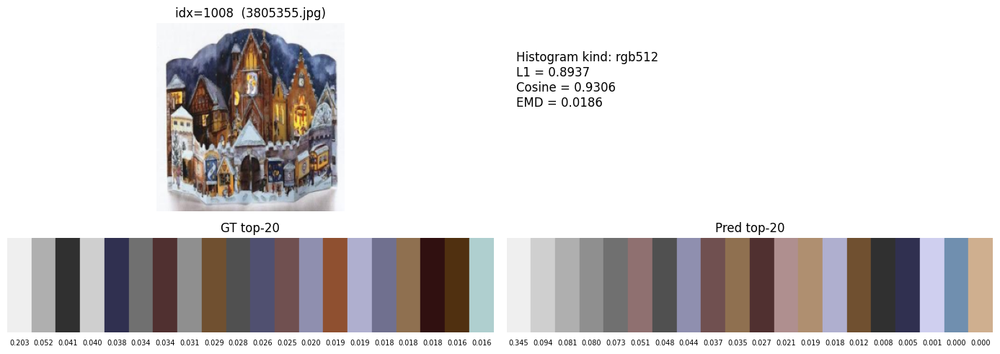

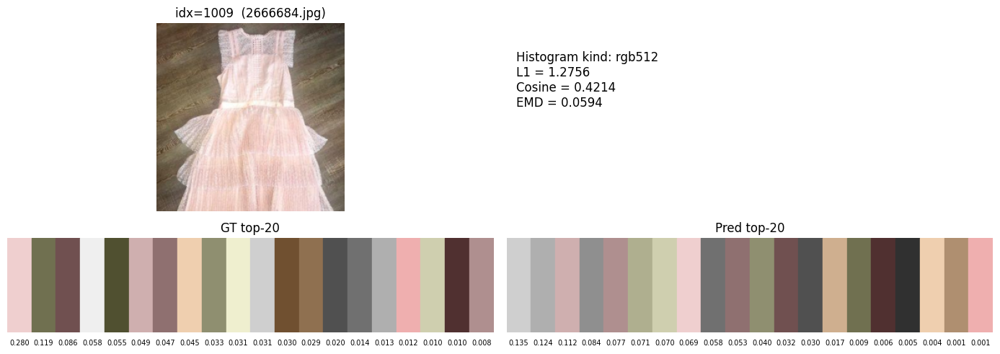

In [22]:
# ==== Aligned GT vs Pred top-20 + IMAGE (first 10) ====
import os, numpy as np, torch, matplotlib.pyplot as plt, pandas as pd
from skimage.color import lab2rgb

import config
from data.dataset import UnifiedImageDataset
from models.color_heads import ColorHead  # your MLP head

# choose the same histogram kind you trained with
HIST_KIND = "rgb512"   # "rgb512" | "lab514" | "hcl514"
BINS      = 8
TOP_K     = 20

# paths
EMB_PATH  = getattr(config, "HF_XL_EMBEDDINGS_TARGET_PATH", getattr(config, "HF_XL_EMBEDDINGS_TARGET_PATH", None))
# EMB_PATH  = getattr(config, "XL_EMBEDDINGS_TARGET_PATH", getattr(config, "XL_EMBEDDINGS_TARGET_PATH", None))

HIST_PATH = {
    "rgb512": config.COLOR_HIST_PATH_RGB,
    "lab514": config.COLOR_HIST_PATH_LAB_514,
    "hcl514": config.COLOR_HIST_PATH_HCL_514,
}[HIST_KIND]
CKPT_PATH = "/data/degis/runs/laion_5m_rgb512_tk40_b4096-20250905-011034/best_color_head_tmp.pth"

# CKPT_PATH = "/data/degis/runs/rgb512_tk100_b4096-20250827-232425/best_color_head_tmp.pth"
# CKPT_PATH = "/data/degis/runs/hcl514_tk100_b4096-20250827-222013/best_color_head_tmp_hcl.pth"
# CKPT_PATH = "best_color_head_hcl.pth"
# CKPT_PATH = "best_color_head.pth"
# CKPT_PATH = "/data/degis/runs/xl_laion_5m_rgb512_tk100_b4096-20250828-191628/best_color_head_tmp.pth"
# CKPT_PATH = "/data/degis/runs/xl_laion_5m_lab514_tk100_b4096-20250828-194651/best_color_head_tmp.pth"
# CKPT_PATH = "/data/degis/runs/xl_laion_5m_hcl514_tk100_b4096-20250828-200646/best_color_head_tmp.pth"



# device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# load arrays (read-only is fine)
emb  = np.load(EMB_PATH,  mmap_mode="r").astype(np.float32, copy=False)
hist = np.load(HIST_PATH, mmap_mode="r").astype(np.float32, copy=False)

# build the SAME dataset ordering you used when generating arrays



# load model
color_head = ColorHead(clip_dim=emb.shape[1], hist_dim=hist.shape[1]).to(device)
color_head.load_state_dict(torch.load(CKPT_PATH, map_location=device))
color_head.eval()

# Optional EMD metric without KeOps (tensorized backend). If unavailable, we just don't show EMD.
try:
    import geomloss
    sinkhorn = geomloss.SamplesLoss("sinkhorn", p=2, blur=0.05, backend="tensorized")
except Exception:
    sinkhorn = None

SPACE = {"rgb512":"rgb", "lab514":"lab", "hcl514":"hcl"}[HIST_KIND]

def _top_palette(vec, bins=BINS, top_k=TOP_K, space=SPACE, c_max=150.0):
    v = vec.detach().cpu().numpy() if isinstance(vec, torch.Tensor) else np.asarray(vec)
    core = v[:bins**3]  # ignore the last 2 BW slots for palette picking
    idxs = np.argsort(core)[-top_k:][::-1]
    cols = []
    if space == "rgb":
        for flat in idxs:
            ri = flat // (bins*bins); gi = (flat // bins) % bins; bi = flat % bins
            cols.append(((ri+0.5)/bins, (gi+0.5)/bins, (bi+0.5)/bins))
    elif space == "lab":
        for flat in idxs:
            Li = flat // (bins*bins); ai = (flat // bins) % bins; bi = flat % bins
            L = (Li+0.5)/bins*100.0
            a = (ai+0.5)/bins*255.0 - 128.0
            b = (bi+0.5)/bins*255.0 - 128.0
            cols.append(tuple(lab2rgb(np.array([[[L,a,b]]]))[0,0]))
    elif space == "hcl":
        for flat in idxs:
            Li = flat // (bins*bins); Ci = (flat // bins) % bins; Hi = flat % bins
            L = (Li+0.5)/bins*100.0
            C = (Ci+0.5)/bins*c_max
            H = (Hi+0.5)/bins*360.0
            a = C*np.cos(np.deg2rad(H)); b = C*np.sin(np.deg2rad(H))
            cols.append(tuple(lab2rgb(np.array([[[L,a,b]]]))[0,0]))
    else:
        raise ValueError("space must be 'rgb' | 'lab' | 'hcl'")
    return cols, core[idxs]

def _plot_palette(ax, colors, values, title):
    for i, (c, v) in enumerate(zip(colors, values)):
        ax.add_patch(plt.Rectangle((i, 0), 1, 1, color=c))
        ax.text(i+0.5, -0.08, f"{v:.3f}", ha="center", va="top", fontsize=7)
    ax.set_xlim(0, len(colors)); ax.set_ylim(0,1); ax.axis("off")
    ax.set_title(title, fontsize=12)

def show_aligned(i, dataset):
    # image from the SAME dataset (guarantees correct ordering)
    img_t, _ = dataset[i]                    # [3,224,224] float [0,1]
    img_np   = img_t.permute(1,2,0).numpy()  # HWC

    # GT and Pred from aligned arrays / model
    h_gt = torch.from_numpy(hist[i]).to(device)
    z    = torch.from_numpy(emb[i]).to(device).unsqueeze(0)

    with torch.no_grad():
        _, p, _ = color_head(z)
        p = p.squeeze(0)
        p = p / (p.sum() + 1e-8)
        g = h_gt / (h_gt.sum() + 1e-8)
        l1  = torch.sum(torch.abs(p-g)).item()
        cos = torch.nn.functional.cosine_similarity(p, g, dim=0).item()
        emd = sinkhorn(p.unsqueeze(0), g.unsqueeze(0)).item() if sinkhorn is not None else None

    gt_cols, gt_vals = _top_palette(g)
    pr_cols, pr_vals = _top_palette(p)

    # draw
    fig, axes = plt.subplots(2, 2, figsize=(14, 5), gridspec_kw={"height_ratios":[2,1]})
    axes[0,0].imshow(img_np); axes[0,0].axis("off")
    basename = os.path.basename(str(dataset.df.iloc[i]["file_path"]))
    axes[0,0].set_title(f"idx={i}  ({basename})")

    axes[0,1].axis("off")
    txt = f"Histogram kind: {HIST_KIND}\nL1 = {l1:.4f}\nCosine = {cos:.4f}"
    if emd is not None: txt += f"\nEMD = {emd:.4f}"
    axes[0,1].text(0.02, 0.85, txt, fontsize=12, va="top")

    _plot_palette(axes[1,0], gt_cols, gt_vals, f"GT top-{TOP_K}")
    _plot_palette(axes[1,1], pr_cols, pr_vals, f"Pred top-{TOP_K}")
    plt.tight_layout(); plt.show()

# for i in range(1000, 1010):
#     show_aligned(i, colour_dataset)
for i in range(1000, 1010):
    show_aligned(i, colour_dataset)

# Generation Setup

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from PIL import Image

import config  # ✅ will work if notebook is in same folder as config.py
from data.dataset import UnifiedImageDataset
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [7]:
import os
HF_CACHE = "/data/hf-cache"
os.makedirs(HF_CACHE, exist_ok=True)

os.environ["HF_HOME"] = HF_CACHE
os.environ["HUGGINGFACE_HUB_CACHE"] = os.path.join(HF_CACHE, "hub")
os.environ["TRANSFORMERS_CACHE"]     = os.path.join(HF_CACHE, "transformers")
os.environ["DIFFUSERS_CACHE"]        = os.path.join(HF_CACHE, "diffusers")
os.environ["TORCH_HOME"]             = os.path.join(HF_CACHE, "torch")

In [8]:
# # from IPython.display import display
# # from torchvision import transforms
# # from ip_adapter import IPAdapter
# # from diffusers import ControlNetModel, StableDiffusionControlNetPipeline

# # # Create pipeline with ControlNet built-in
# # controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny")

# # pipe = StableDiffusionControlNetPipeline.from_pretrained(
# #     "runwayml/stable-diffusion-v1-5", 
# #     controlnet=controlnet,
# #     torch_dtype=torch.float16,
# #     safety_checker=None,
# #     feature_extractor=None,
# #     cache_dir=HF_CACHE,
# # ).to(device)

# # pipe.controlnet = pipe.controlnet.to(dtype=torch.float16)

# # # Now create IP-Adapter (it will automatically detect the ControlNet)
# # ip_adapter = IPAdapter(
# #     sd_pipe=pipe,  # This pipe already has ControlNet integrated
# #     image_encoder_path="laion/CLIP-ViT-H-14-laion2B-s32B-b79K",
# #     ip_ckpt="/data/thesis/models/ip-adapter_sd15.bin",
# #     device=device,
# #     embedding_type='clip'
# # )

# from IPython.display import display
# from torchvision import transforms
# import ip_adapter
# from ip_adapter import IPAdapterXL
# from diffusers import ControlNetModel, StableDiffusionXLControlNetPipeline
# # from ip_adapter import IPAdapterXL  # Changed to XL version
# # from diffusers import ControlNetModel, StableDiffusionControlNetPipeline

# # Create pipeline with SDXL-compatible ControlNet
# controlnet = ControlNetModel.from_pretrained("diffusers/controlnet-canny-sdxl-1.0")  # SDXL ControlNet

# pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
#     "stabilityai/stable-diffusion-xl-base-1.0",  # SDXL base model
#     controlnet=controlnet,
#     torch_dtype=torch.float16,
#     safety_checker=None,
#     feature_extractor=None,
#     cache_dir=HF_CACHE,
#     device=device,
# ).to(device)

# pipe.controlnet = pipe.controlnet.to(dtype=torch.float16)

# # Now create IP-Adapter XL
# ip_adapter = IPAdapterXL(  # Changed to XL version
#     sd_pipe=pipe,
#     image_encoder_path="laion/CLIP-ViT-bigG-14-laion2B-39B-b160k",  # ViT-bigG-14
#     ip_ckpt="/data/thesis/models/ip-adapter_sdxl.bin",  # SDXL checkpoint
#     device=device,
#     embedding_type='clip'
# )

In [9]:
from IPython.display import display
from torchvision import transforms
from ip_adapter import IPAdapter
from diffusers import ControlNetModel, StableDiffusionControlNetPipeline

# Create pipeline with ControlNet built-in
controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny")

pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", 
    controlnet=controlnet,
    torch_dtype=torch.float16,
    safety_checker=None,
    feature_extractor=None,
    cache_dir=HF_CACHE,
).to(device)

pipe.controlnet = pipe.controlnet.to(dtype=torch.float16)

# Now create IP-Adapter (it will automatically detect the ControlNet)
ip_adapter = IPAdapter(
    sd_pipe=pipe,  # This pipe already has ControlNet integrated
    image_encoder_path="laion/CLIP-ViT-H-14-laion2B-s32B-b79K",
    ip_ckpt="/data/thesis/models/ip-adapter_sd15.bin",
    device=device,
    embedding_type='clip'
)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [10]:
torch.load("/data/thesis/models/ip-adapter-plus_sd15.bin", map_location="cpu").keys()

dict_keys(['image_proj', 'ip_adapter'])

In [11]:
from PIL import Image
import numpy as np

from PIL import Image, ImageOps
import numpy as np
import torch
import torch.nn.functional as F
to_pil = transforms.ToPILImage()
# edges = np.load(config.EDGE_MAPS_PATH, mmap_mode="r")
edges = np.load("/data/thesis/data/adimagenet_edge_maps.npy", mmap_mode="r")
# def display_images(images):
#     for img in images:
#         display(img)

def display_images_grid(original, control, generated, cols=3, padding=10, bg_color=(255, 255, 255), size=512):
    """
    Display original, control, and generated images in a single grid, resized to the same size.
    """
    # Resize all to the same size (default 512x512)
    original = original.resize((size, size))
    control = control.resize((size, size))
    generated = [img.resize((size, size)) for img in generated]

    # Put all images together
    all_images = [original, control] + generated
    
    w, h = size, size
    rows = (len(all_images) + cols - 1) // cols
    
    grid_w = cols * w + (cols - 1) * padding
    grid_h = rows * h + (rows - 1) * padding
    
    grid_img = Image.new("RGB", (grid_w, grid_h), color=bg_color)
    
    for i, img in enumerate(all_images):
        row, col = divmod(i, cols)
        x = col * (w + padding)
        y = row * (h + padding)
        grid_img.paste(img, (x, y))
    
    display(grid_img)

def _control_edge_pil(layout_index: int, size: int = 512) -> Image.Image:
    """Return a ControlNet-ready edge PIL (RGB, size×size) from cached edges[i]."""
    row = edges[layout_index]  # shape [H*W] (uint8 or float32), memmap ok
    H, W = getattr(config, "IMG_SIZE", (224, 224))
    if row.ndim == 1 and row.shape[0] != H * W:
        side = int(np.sqrt(row.shape[0])); H = W = side
    edge = row.reshape(H, W)
    if edge.dtype != np.uint8:
        edge = (edge * 255.0).clip(0, 255).astype(np.uint8)
    pil = Image.fromarray(edge)                          # grayscale
    pil = ImageOps.autocontrast(pil)                     # just to visualize better
    pil = pil.resize((size, size), Image.BILINEAR).convert("RGB")  # ControlNet likes RGB
    return pil


@torch.no_grad()
def generate_from_dataset_id(colour_index: int,
                             layout_index: int,
                             prompt: str = "a cat playing with a ball",
                             guidance_scale: float = 0.0,
                             steps: int = 30,
                             controlnet_conditioning_scale: float = 0.0,
                             num_samples: int = 1):
    # 1) dataset image (only for display)
    img_t, _ = colour_dataset[colour_index]
    pil_img = to_pil(img_t)

    # 2) CLIP embedding (prefer precomputed)
    try:
        z_clip = torch.as_tensor(emb[colour_index], dtype=torch.float32, device=device).unsqueeze(0)  # Keep as float32
    except Exception:
        z_clip = clip_model.encode_image(preprocess(pil_img).unsqueeze(0).to(device)).float()  # Keep as float32

    # (optional) you can still compute color_map_embedding if you need it elsewhere
    _, _, color_map_embedding = color_head(z_clip)  # color_head works with float32


    # ControlNet edge image from cached edges
    control_pil = _control_edge_pil(layout_index, size=512)


    # 4) Generate from CLIP embedding with IP-Adapter
    images = ip_adapter.generate(
        # pil_image=pil_img,
        clip_image_embeds=color_map_embedding.to(device=device, dtype=torch.float16).contiguous(),  # Convert to float16 for IP-Adapter
        # clip_image_embeds=z_clip.half(),
        prompt=prompt,
        num_samples=num_samples,
        guidance_scale=guidance_scale,
        num_inference_steps=steps,            # 30–60 is usually plenty
        # ---- ControlNet knobs (make layout stronger) ----
        image=control_pil,                               # control image (your layout/edges)
        controlnet_conditioning_scale=controlnet_conditioning_scale,           # try 1.2–2.0 for canny/HED
        control_guidance_start=0.0,                  # apply from the first step
        control_guidance_end=1.0,                    # …to the last step
        # guess_mode=False,                            # strongest control
        device=device,
        negative_prompt="monochrome, lowres, bad anatomy, worst quality, low quality, blurryr, sketch, cartoon, drawing, anime:1.4, cartoon, comic, illustration, posterized, mosaic, stained glass, abstract, surreal, psychedelic, trippy, texture artifact, embroidery, knitted, painting, lowres, oversaturated, unrealistic, bad shading"
    )

    display_images_grid(pil_img, control_pil, images, cols=3)

    return images

In [12]:
# for i in range(1000,1002):
generate_from_dataset_id(colour_index=1008,
                        layout_index=33,
                        prompt="a cat on the hoodie",
                        guidance_scale=7.5,
                        steps=200,
                        controlnet_conditioning_scale=0.8,
                        num_samples=1)

RuntimeError: mat1 and mat2 shapes cannot be multiplied (1x1280 and 1024x3072)

In [ ]:
# for i in range(5):
#     generate_from_dataset_id(colour_index=38,
#                             layout_index=33,
#                             prompt="a dog on the hoodie",
#                             guidance_scale=5.0,
#                             steps=200,
#                             controlnet_conditioning_scale=1.0,
#                             num_samples=1)

In [ ]:
# # for i in range(1000,1002):
# generate_from_dataset_id(colour_index=1000,
#                         layout_index=33,
#                         prompt="a dog on the hoodie",
#                         guidance_scale=5.0,
#                         steps=200,
#                         controlnet_conditioning_scale=0.8,
#                         num_samples=1)

In [8]:
# from IPython.display import display
# from torchvision import transforms
# from ip_adapter import IPAdapter
# from diffusers import ControlNetModel, StableDiffusionControlNetPipeline

# # Create pipeline with ControlNet built-in
# controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny")

# pipe = StableDiffusionControlNetPipeline.from_pretrained(
#     "runwayml/stable-diffusion-v1-5", 
#     controlnet=controlnet,
#     torch_dtype=torch.float16,
#     safety_checker=None,
#     feature_extractor=None,
#     cache_dir=HF_CACHE,
# ).to(device)

# pipe.controlnet = pipe.controlnet.to(dtype=torch.float16)

# # Now create IP-Adapter (it will automatically detect the ControlNet)
# ip_adapter = IPAdapter(
#     sd_pipe=pipe,  # This pipe already has ControlNet integrated
#     image_encoder_path="laion/CLIP-ViT-H-14-laion2B-s32B-b79K",
#     ip_ckpt="/data/thesis/models/ip-adapter_sd15.bin",
#     device=device,
#     embedding_type='clip'
# )

from IPython.display import display
from torchvision import transforms
import ip_adapter
from ip_adapter import IPAdapterXL
from diffusers import ControlNetModel, StableDiffusionXLControlNetPipeline
# from ip_adapter import IPAdapterXL  # Changed to XL version
# from diffusers import ControlNetModel, StableDiffusionControlNetPipeline

# Create pipeline with SDXL-compatible ControlNet
controlnet = ControlNetModel.from_pretrained("diffusers/controlnet-canny-sdxl-1.0")  # SDXL ControlNet

pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",  # SDXL base model
    controlnet=controlnet,
    torch_dtype=torch.float16,
    safety_checker=None,
    feature_extractor=None,
    cache_dir=HF_CACHE,
    device=device,
).to(device)

pipe.controlnet = pipe.controlnet.to(dtype=torch.float16)

# Now create IP-Adapter XL
ip_adapter = IPAdapterXL(  # Changed to XL version
    sd_pipe=pipe,
    image_encoder_path="laion/CLIP-ViT-bigG-14-laion2B-39B-b160k",  # ViT-bigG-14
    ip_ckpt="/data/thesis/models/ip-adapter_sdxl.bin",  # SDXL checkpoint
    device=device,
    embedding_type='clip'
)

Keyword arguments {'safety_checker': None, 'device': device(type='cuda')} are not expected by StableDiffusionXLControlNetPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [10]:
from PIL import Image
import numpy as np

from PIL import Image, ImageOps
import numpy as np
import torch
import torch.nn.functional as F
to_pil = transforms.ToPILImage()
# edges = np.load(config.EDGE_MAPS_PATH, mmap_mode="r")
edges = np.load("/data/thesis/data/adimagenet_edge_maps.npy", mmap_mode="r")
# def display_images(images):
#     for img in images:
#         display(img)

def display_images_grid(original, control, generated, cols=3, padding=10, bg_color=(255, 255, 255), size=512):
    """
    Display original, control, and generated images in a single grid, resized to the same size.
    """
    # Resize all to the same size (default 512x512)
    original = original.resize((size, size))
    control = control.resize((size, size))
    generated = [img.resize((size, size)) for img in generated]

    # Put all images together
    all_images = [original, control] + generated
    
    w, h = size, size
    rows = (len(all_images) + cols - 1) // cols
    
    grid_w = cols * w + (cols - 1) * padding
    grid_h = rows * h + (rows - 1) * padding
    
    grid_img = Image.new("RGB", (grid_w, grid_h), color=bg_color)
    
    for i, img in enumerate(all_images):
        row, col = divmod(i, cols)
        x = col * (w + padding)
        y = row * (h + padding)
        grid_img.paste(img, (x, y))
    
    display(grid_img)

def _control_edge_pil(layout_index: int, size: int = 512) -> Image.Image:
    """Return a ControlNet-ready edge PIL (RGB, size×size) from cached edges[i]."""
    row = edges[layout_index]  # shape [H*W] (uint8 or float32), memmap ok
    H, W = getattr(config, "IMG_SIZE", (224, 224))
    if row.ndim == 1 and row.shape[0] != H * W:
        side = int(np.sqrt(row.shape[0])); H = W = side
    edge = row.reshape(H, W)
    if edge.dtype != np.uint8:
        edge = (edge * 255.0).clip(0, 255).astype(np.uint8)
    pil = Image.fromarray(edge)                          # grayscale
    pil = ImageOps.autocontrast(pil)                     # just to visualize better
    pil = pil.resize((size, size), Image.BILINEAR).convert("RGB")  # ControlNet likes RGB
    return pil


@torch.no_grad()
def generate_from_dataset_id(colour_index: int,
                             layout_index: int,
                             prompt: str = "a cat playing with a ball",
                             guidance_scale: float = 0.0,
                             steps: int = 30,
                             controlnet_conditioning_scale: float = 0.0,
                             num_samples: int = 1):
    # 1) dataset image (only for display)
    img_t, _ = colour_dataset[colour_index]
    pil_img = to_pil(img_t)

    # 2) CLIP embedding (prefer precomputed)
    try:
        z_clip = torch.as_tensor(emb[colour_index], dtype=torch.float32, device=device).unsqueeze(0)  # Keep as float32
    except Exception:
        z_clip = clip_model.encode_image(preprocess(pil_img).unsqueeze(0).to(device)).float()  # Keep as float32

    # (optional) you can still compute color_map_embedding if you need it elsewhere
    _, _, color_map_embedding = color_head(z_clip)  # color_head works with float32


    # ControlNet edge image from cached edges
    control_pil = _control_edge_pil(layout_index, size=512)


    # 4) Generate from CLIP embedding with IP-Adapter
    images = ip_adapter.generate(
        # pil_image=pil_img,
        clip_image_embeds=color_map_embedding.to(device=device, dtype=torch.float16).contiguous(),  # Convert to float16 for IP-Adapter
        # clip_image_embeds=z_clip.half(),
        prompt=prompt,
        num_samples=num_samples,
        scale=guidance_scale,
        num_inference_steps=steps,            # 30–60 is usually plenty
        # ---- ControlNet knobs (make layout stronger) ----
        image=control_pil,                               # control image (your layout/edges)
        controlnet_conditioning_scale=controlnet_conditioning_scale,           # try 1.2–2.0 for canny/HED
        control_guidance_start=0.0,                  # apply from the first step
        control_guidance_end=1.0,                    # …to the last step
        # guess_mode=False,                            # strongest control
        device=device,
        negative_prompt="monochrome, lowres, bad anatomy, worst quality, low quality, blurryr, sketch, cartoon, drawing, anime:1.4, cartoon, comic, illustration, posterized, mosaic, stained glass, abstract, surreal, psychedelic, trippy, texture artifact, embroidery, knitted, painting, lowres, oversaturated, unrealistic, bad shading"
    )

    display_images_grid(pil_img, control_pil, images, cols=3)

    return images

  0%|          | 0/500 [00:00<?, ?it/s]

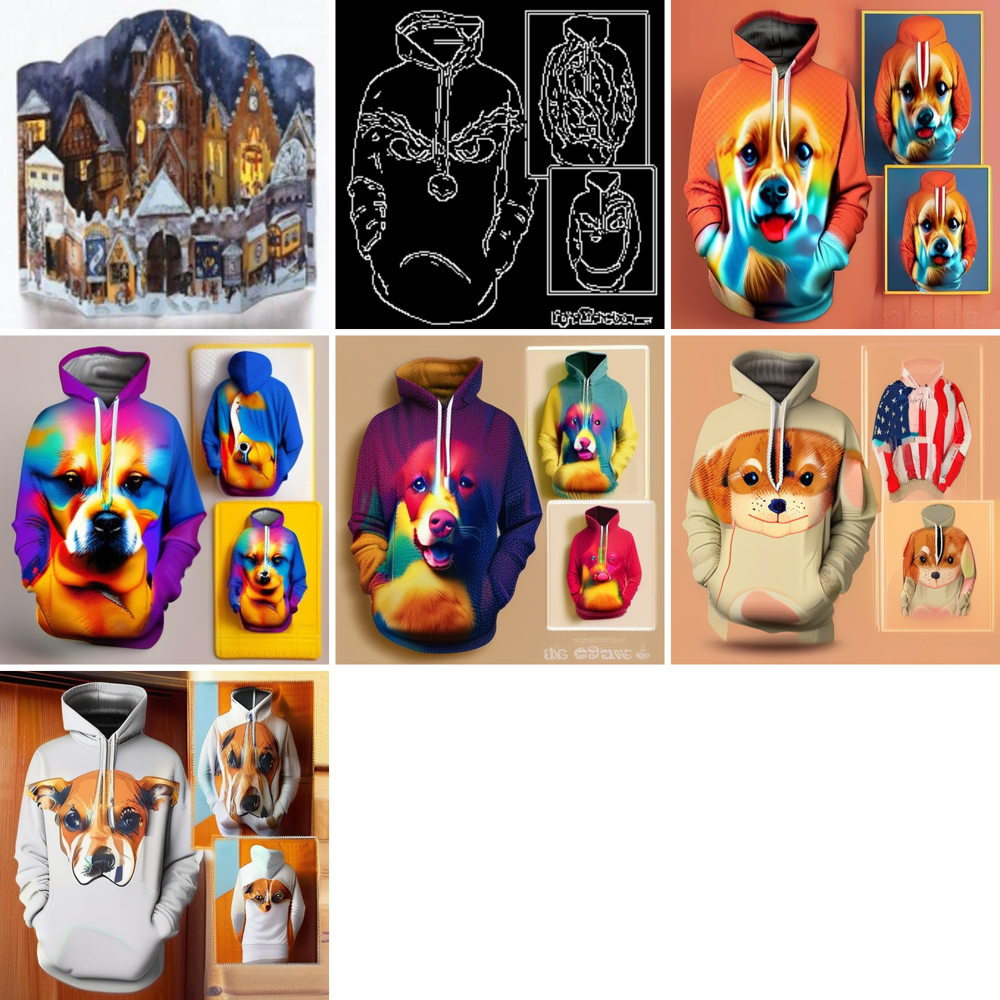

[<PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>]

In [25]:
generate_from_dataset_id(colour_index=1008,
                        layout_index=33,
                        prompt="a dog on the hoodie",
                        guidance_scale=0.5,
                        steps=500,
                        controlnet_conditioning_scale=0.5,
                        num_samples=5)

  0%|          | 0/500 [00:00<?, ?it/s]

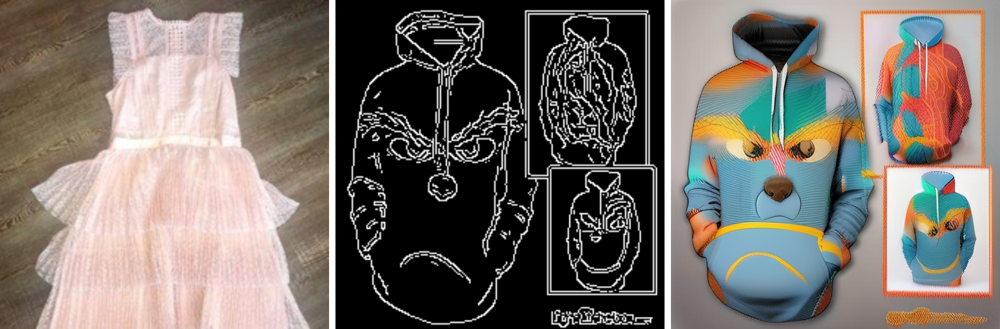

[<PIL.Image.Image image mode=RGB size=512x512>]

In [24]:
generate_from_dataset_id(colour_index=1009,
                        layout_index=33,
                        prompt="a dog on the hoodie",
                        guidance_scale=0.5,
                        steps=500,
                        controlnet_conditioning_scale=0.8,
                        num_samples=1)

  0%|          | 0/500 [00:00<?, ?it/s]

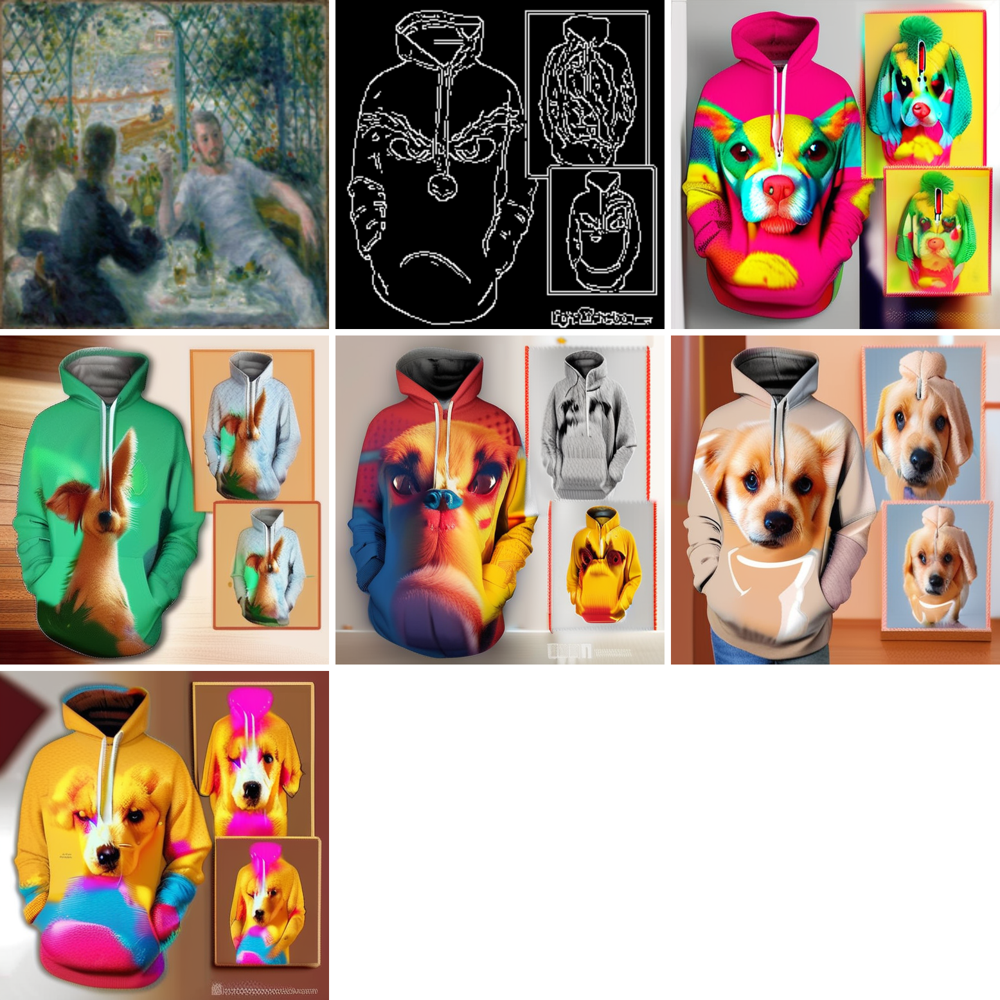

[<PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>]

In [21]:
generate_from_dataset_id(colour_index=1001,
                        layout_index=33,
                        prompt="a dog on the hoodie",
                        guidance_scale=0.5,
                        steps=500,
                        controlnet_conditioning_scale=0.5,
                        num_samples=5)